In [118]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
from glob import glob
import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf
from itertools import cycle
import scipy
from scipy import signal
import math
import audiomentations
import soundfile as sf

In [119]:
import sys
sys.path.append('pafx-main')
from pafx.comb import Comb
from pafx.allpass import Allpass
from pafx.tapped_delay_line import TappedDelayLine
from pafx.reverb import Reverb, ReverbConfig
from pafx.equalizer import Equalizer
from pafx.echo import Echo
from pafx.chorus import Chorus
from pafx.flanger import Flanger
from pafx.vibrato import Vibrato
from pafx.tremolo import Tremolo
from pafx.fade import Fade, FadeIn, FadeOut

In [120]:
#English Voice
raw_eng_voice = glob('audios/Actor_21/03-01-01-01-02-01-21.wav') #Raw Voice
angry_eng_voice_0 = glob('audios/Actor_21/03-01-05-01-02-01-21.wav') #Angry Voice Without Intensity
angry_eng_voice_1 = glob('audios/Actor_21/03-01-05-02-02-01-21.wav') #Angry Voice With Intensity
sf.info(raw_eng_voice[0])

audios/Actor_21/03-01-01-01-02-01-21.wav
samplerate: 48000 Hz
channels: 1
duration: 3.604 s
format: WAV (Microsoft) [WAV]
subtype: Signed 16 bit PCM [PCM_16]

In [121]:
ipd.Audio(raw_eng_voice[0])

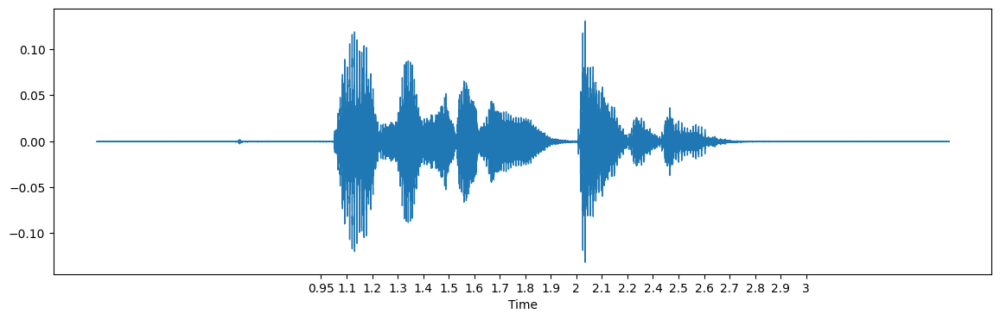

In [122]:
#Wave Graph of Raw English Voice
data, sample_rate = librosa.load(raw_eng_voice[0])
fig, ax = plt.subplots(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate, ax=ax)
ax.set_xticks(np.linspace(0.95, 3, 20))

In [123]:
ipd.Audio(angry_eng_voice_0[0])

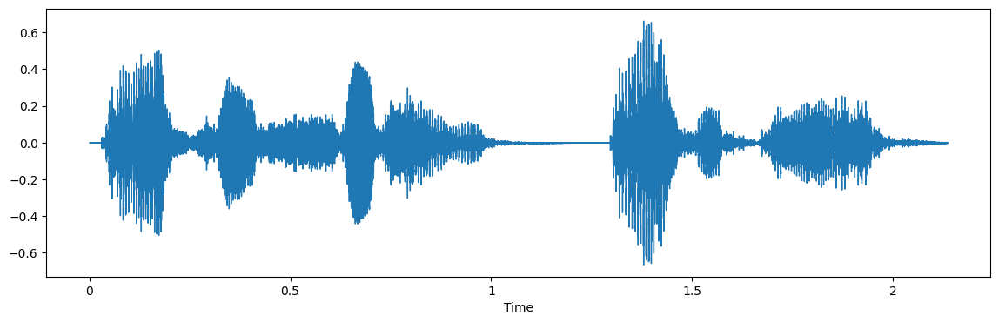

In [124]:
#Wave Graph of Angry English Voice Without Intensity
data, sample_rate = librosa.load(angry_eng_voice_0[0])
data, index = librosa.effects.trim(data, top_db=40)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
ipd.Audio(data, rate=sample_rate)

In [125]:
ipd.Audio(angry_eng_voice_1[0])

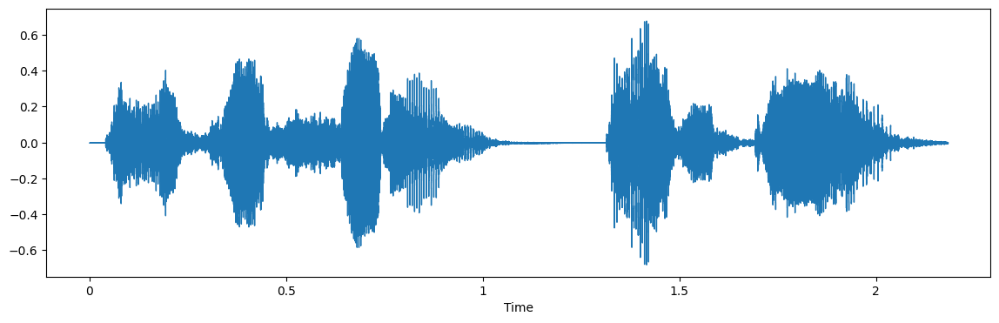

In [126]:
#Wave Graph of Angry Voice With Intensity
data, sample_rate = librosa.load(angry_eng_voice_1[0])
data, index = librosa.effects.trim(data, top_db=40)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
ipd.Audio(data, rate=sample_rate)

In [127]:
#Turkish Voice
sf.info('audios/voice_tr_test.wav')

audios/voice_tr_test.wav
samplerate: 44100 Hz
channels: 2
duration: 4.337 s
format: WAV (Microsoft) [WAV]
subtype: Signed 16 bit PCM [PCM_16]

In [128]:
#Change The Channel of Wave File to 1 to Process Voice
file = 'audios/voice_tr.wav'
'''
audio = AudioSegment.from_file("audios/voice_tr_test.wav", format='wav')
audio = audio.set_channels(1)
audio.export('audios/voice_tr.wav', format='wav')
'''
data, sample_rate = sf.read(file)

In [129]:
#Channel is set to 1
sf.info(file)

audios/voice_tr.wav
samplerate: 44100 Hz
channels: 1
duration: 4.337 s
format: WAV (Microsoft) [WAV]
subtype: Signed 16 bit PCM [PCM_16]

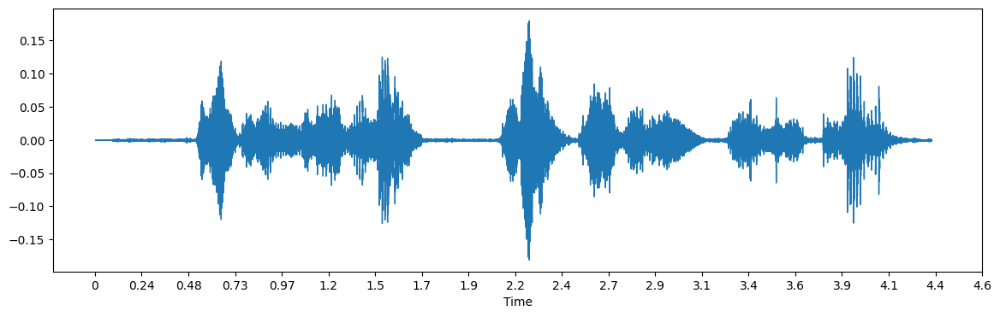

In [130]:
#Turkish Voice Graph
data, sample_rate = librosa.load(file)
fig, ax = plt.subplots(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate, ax=ax)
ax.set_xticks(np.linspace(0, 4.6, 20))

In [131]:
#Filter functions

In [132]:
def noise(data, noise_factor):
    noise_amp = noise_factor*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

In [133]:
def stretch(data, smpl_rate):
    return librosa.effects.time_stretch(data,rate=smpl_rate)

In [134]:
def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

In [135]:
def pitch(data, sampling_rate, pitch_factor):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

In [136]:
def intensity(data, percussive_rate, harmonic_rate):
    y_harmonic, y_percussive = librosa.effects.hpss(data)
    y_percussive_louder = np.multiply(y_percussive, percussive_rate)
    y_harmonic_louder = np.multiply(y_harmonic, harmonic_rate)
    y_total = y_harmonic_louder + y_percussive_louder
    return y_total

In [137]:
def test_filters(input_file):
    x, fs  = sf.read(input_file)
    comb = Comb(100, 0.9, 0)
    allpass = Allpass(100, 0.7)

    tap_delays = [190,  949,  993,  1183, 1192, 1315,
                    2021, 2140, 2524, 2590, 2625, 2700,
                    3119, 3123, 3202, 3268, 3321, 3515]

    tap_gains = [.841, .504, .49,  .379, .38,  .346,
                    .289, .272, .192, .193, .217,  .181,
                    .18,  .181, .176, .142, .167, .134]

    tdl = TappedDelayLine(tap_delays, tap_gains)  

    yc = np.zeros(len(x))
    ya = np.zeros(len(x))
    yt = np.zeros(len(x))
    # Start Processing
    for i in range(len(x)):
        yc[i] = comb.process(x[i])
        ya[i] = allpass.process(x[i])
        yt[i] = tdl.process(x[i])

    # Save Results
    output_file = "audios/results/comb.wav"
    yc = yc / max(np.abs(yc))
    sf.write(output_file, yc, fs)

    output_file = "audios/results/allpass.wav"
    ya = ya / max(np.abs(ya))
    sf.write(output_file, ya, fs)

    output_file = "audios/results/tpl.wav"
    yt = yt / max(np.abs(yt))
    sf.write(output_file, yt, fs)

In [138]:
def test_eq(input_file, hz_32, hz_63, hz_125, hz_250, hz_500, hz_1000, hz_2000, hz_4000, hz_8000, hz_16000):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))

    eq_gains = [hz_32, hz_63, hz_125, hz_250, hz_500, hz_1000, hz_2000, hz_4000, hz_8000, hz_16000]
    eq = Equalizer(eq_gains, fs)
    eq.dump()
    
    # Start Processing
    for i in range(len(x)):
        y[i] = eq.process(x[i])

    output_file = "audios/results/eq.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [139]:
def test_reverb(input_file):
    x, fs  = sf.read(input_file)

    config = ReverbConfig()
    config.room_scale = 70
    config.pre_delay = 50
    config.dry_gain = -5
    config.wet_gain = 5
    config.hf_damping = 30
    config.reverberance = 100
    config.stereo_width = 50
    config.er_gain = 0.2
    reverb = Reverb(config, fs)

    y = np.zeros(len(x))
    # Start Processing
    for i in range(len(x)):
        y[i] = reverb.process(x[i])

    output_file = "audios/results/reverb.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [140]:
def test_echo(input_file):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))

    echo_gains = [0.5]
    echo_delays = [0.05]
    echo = Echo(fs, echo_delays, echo_gains, 0.5)
    # Start Processing
    for i in range(len(x)):
        y[i] = echo.process(x[i])

    output_file = "audios/results/echo.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [141]:
def test_chorus(input_file):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))

    gains = [0.5]
    delays = [0.05]
    mod_widths = [0.005]
    mod_freqs = [2]
    dry_gain = 1
    chorus = Chorus(fs, delays, mod_freqs, mod_widths, gains, dry_gain)
    # Start Processing
    for i in range(len(x)):
        y[i] = chorus.process(x[i])

    output_file = "audios/results/chorus.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [142]:
def test_flanger(input_file):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))

    delay = 0.01
    mod_width = 0.003
    mod_freq = 1
    flanger = Flanger(fs, delay, mod_width, mod_freq)
    # Start Processing
    for i in range(len(x)):
        y[i] = flanger.process(x[i])
    output_file = "audios/results/flanger.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [143]:
def test_vibrato(input_file, mod_freq, mod_width):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))

    delay = 0.008
    vibrato = Vibrato(fs, delay, mod_width, mod_freq)
    # Start Processing
    for i in range(len(x)):
        y[i] = vibrato.process(x[i])
    output_file = "audios/results/vibrato.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [144]:
def test_tremolo(input_file, mod_freq, mod_depth):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))
    

    tremolo = Tremolo(mod_freq, mod_depth, fs)
    # Start Processing
    for i in range(len(x)):
        y[i] = tremolo.process(x[i])
    output_file = "audios/results/tremolo.wav"
    y = y / max(np.abs(y))
    sf.write(output_file, y, fs)

In [145]:
def test_fade(input_file):
    x, fs  = sf.read(input_file)
    y = np.zeros(len(x))
    y1 = np.zeros(len(x))
    y2 = np.zeros(len(x))

    in_length = 5
    out_start = 5
    out_length = 5
    fade = Fade(fs, in_length, out_start, out_length)
    fade_in = FadeIn(fs, in_length)
    fade_out = FadeOut(fs, out_length)
    # Start Processing
    for i in range(len(x)):
        y[i] = fade.process(x[i])
        y1[i] = fade_in.process(x[i])
        y2[i] = fade_out.process(x[i])
    y = y / max(np.abs(y))
    y1 = y1 / max(np.abs(y1))
    y2 = y2 / max(np.abs(y2))
    sf.write("audios/results/fade.wav", y, fs)
    sf.write("audios/results/fade_in.wav", y1, fs)
    sf.write("audios/results/fade_out.wav", y2, fs)

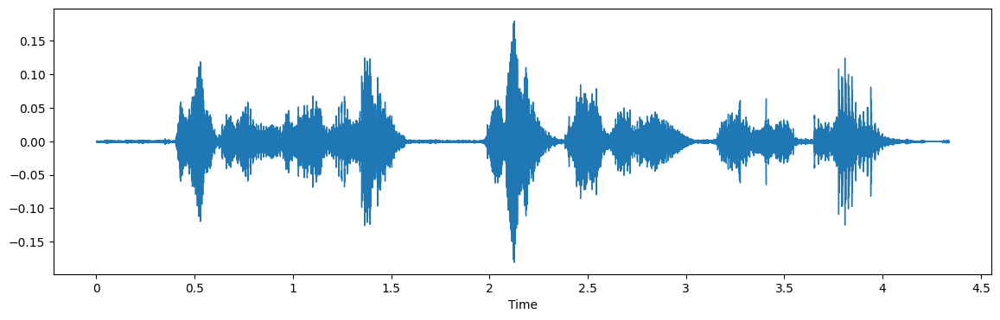

In [146]:
#Shift The Voice
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

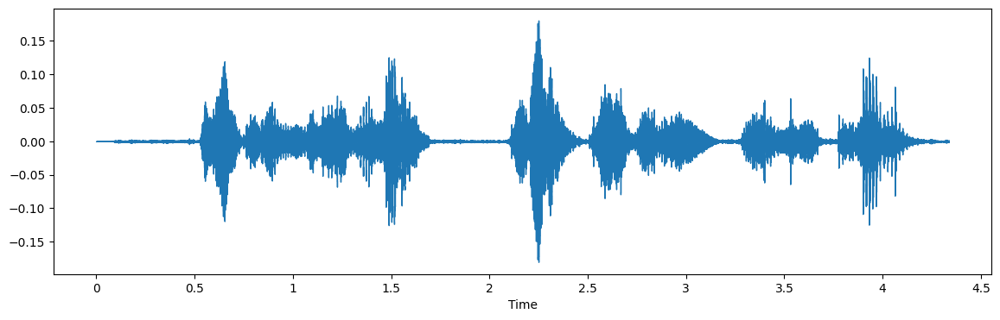

In [147]:
#White Noise Adjustment
x = noise(data,noise_factor=0)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

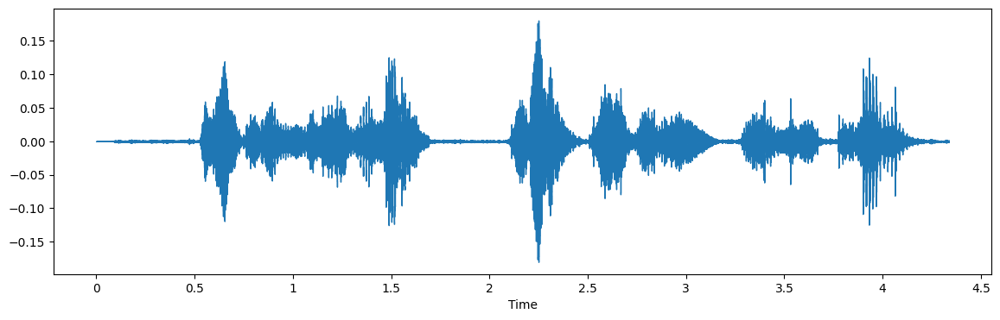

In [148]:
#Raw Audio Sample
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
ipd.Audio(file)

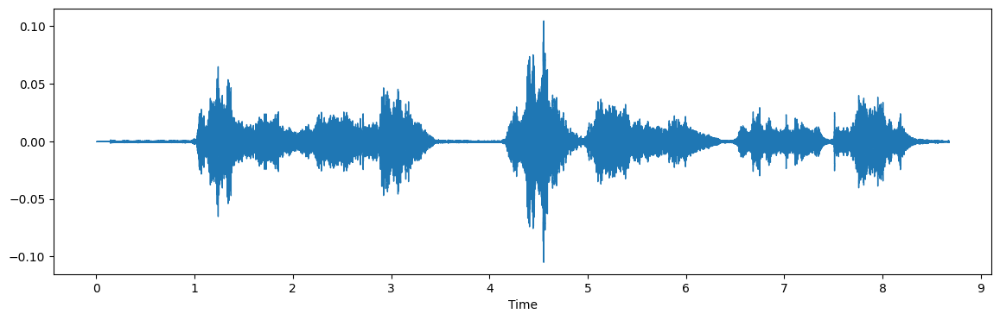

In [149]:
#Stretch and change speech rate
x = stretch(data, smpl_rate=0.5)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

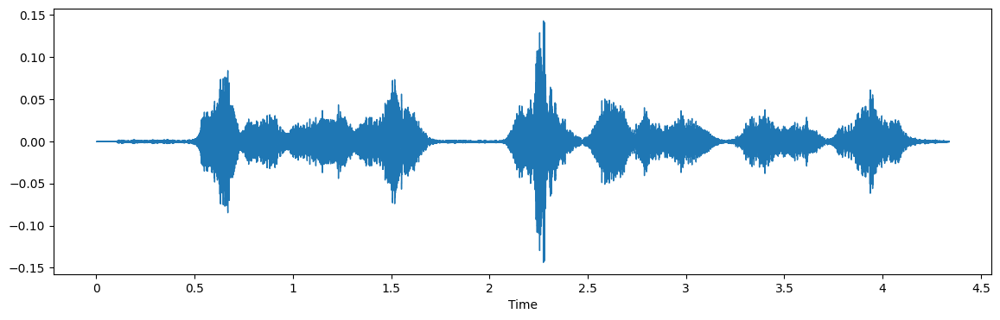

In [150]:
#Pitch Change
x = pitch(data, sample_rate, pitch_factor=1)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

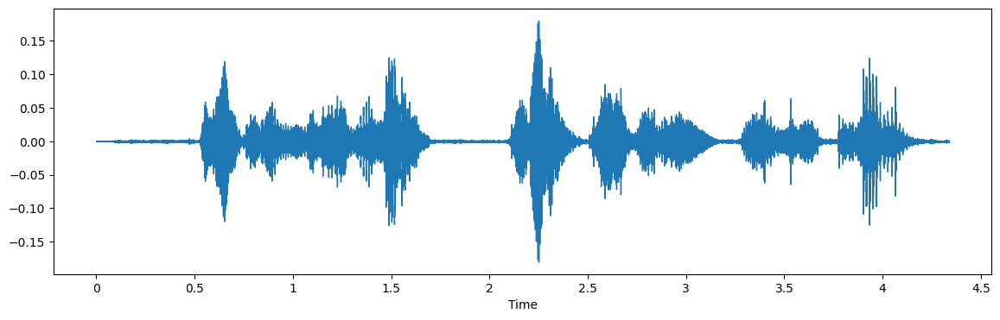

In [151]:
#Seperate HARMONIC and PERCUSSIVE and adjustments
x = intensity(data, percussive_rate=1, harmonic_rate=1)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

In [152]:
#Run all voice filters on a 'file' and save output
input_file = file
'''
test_filters(input_file)
test_eq(input_file)
test_reverb(input_file)
test_echo(input_file)
test_chorus(input_file)
test_flanger(input_file)
test_vibrato(input_file)
test_tremolo(input_file)
test_fade(input_file)
'''
test_filters(input_file)
test_eq(input_file, 1,1,1,1,1,1,1,1,1,1)
test_reverb(input_file)
test_echo(input_file)
test_chorus(input_file)
test_flanger(input_file)
test_vibrato(input_file, mod_freq=2, mod_width=0.008)
test_tremolo(input_file, mod_depth = 0.5, mod_freq = 10)
test_fade(input_file)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.993757, a2: 0.993776
       b0: 1.000185, b1: -1.993756, b2: 0.993592

Biquad Type: Peaking, Fc: 63.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.987860, a2: 0.987940
       b0: 1.000736, b1: -1.987860, b2: 0.987205

Biquad Type: Peaking, Fc: 125.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.976087, a2: 0.976401
       b0: 1.001440, b1: -1.976087, b2: 0.974961

Biquad Type: Peaking, Fc: 250.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.952377, a2: 0.953616
       b0: 1.002830, b1: -1.952377, b2: 0.950786

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.904790, a2: 0.909634
       b0: 1.005513, b1: -1.904790, b2: 0.904121

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.808965, a2: 0.827482
       b0: 1.010525, b1: -1.808965, b2: 0.816956

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 1.0dB
       a0: 1.000000, a1: -1.617124, a2: 0.685074
       b0: 1.019213, b1: -1

In [153]:
test_filters(input_file)
allpass_filter = "audios/results/allpass.wav"
ipd.Audio(allpass_filter)

In [154]:
comb_filter = "audios/results/comb.wav"
allpass_filter = "audios/results/allpass.wav"
tpl_filter = "audios/results/tpl.wav"
equalizered = "audios/results/eq.wav"
reverbed = "audios/results/reverb.wav"
echo_filter = "audios/results/echo.wav"
chorus_filter = "audios/results/chorus.wav"
flanger_filter = "audios/results/flanger.wav"
vibrato_filter = "audios/results/vibrato.wav"
tremolo_filter = "audios/results/tremolo.wav"
fade_filter = "audios/results/fade.wav"
fade_in_filter = "audios/results/fade_in.wav"
fade_out_filter = "audios/results/fade_out.wav"

In [155]:
#Testing Filters
ipd.Audio(file)

In [156]:
ipd.Audio(comb_filter)

In [157]:
ipd.Audio(allpass_filter)

In [158]:
ipd.Audio(tpl_filter)

In [159]:
ipd.Audio(equalizered)

In [160]:
ipd.Audio(reverbed)

In [161]:
ipd.Audio(echo_filter)

In [162]:
ipd.Audio(chorus_filter)

In [163]:
ipd.Audio(flanger_filter)

In [164]:
ipd.Audio(vibrato_filter)

In [165]:
ipd.Audio(tremolo_filter)

In [166]:
ipd.Audio(fade_filter)

In [167]:
ipd.Audio(fade_in_filter)

In [168]:
ipd.Audio(fade_out_filter)

In [169]:
#Angry Voice
voice = data
#speech rate increase
voice = stretch(voice, smpl_rate=1.4)
#pitch slightly higher
voice = pitch(voice, sampling_rate=sample_rate, pitch_factor=-0.5)
#intensity higher
voice = intensity(voice, percussive_rate=3, harmonic_rate=1)
#Take output
sf.write("audios/results/librosa_output.wav", voice, sample_rate)
augmented_file = "audios/results/librosa_output.wav"
#Equalizer deep
test_eq(augmented_file, -10, -10, 15, 10, 7, 5, 5, 10, -8, -8)
#Equalizer low
#test_eq(augmented_file, -20, -10, -10, -5, 5, 5, 10, 5, 6, -8)
equalizered_file = "audios/results/eq.wav"
ipd.Audio("audios/results/eq.wav", rate=sample_rate)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.982866, a2: 0.983008
       b0: 0.996257, b1: -1.982914, b2: 0.986702

Biquad Type: Peaking, Fc: 63.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.955000, a2: 0.955315
       b0: 0.984723, b1: -1.955000, b2: 0.970592

Biquad Type: Peaking, Fc: 125.0Hz, Gain: 15.0dB
       a0: 1.000000, a1: -1.977639, a2: 0.978894
       b0: 1.048791, b1: -1.977639, b2: 0.930103

Biquad Type: Peaking, Fc: 250.0Hz, Gain: 10.0dB
       a0: 1.000000, a1: -1.940087, a2: 0.945020
       b0: 1.059441, b1: -1.940087, b2: 0.885579

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 7.0dB
       a0: 1.000000, a1: -1.855714, a2: 0.874710
       b0: 1.077600, b1: -1.855714, b2: 0.797110

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.671248, a2: 0.741473
       b0: 1.100603, b1: -1.671248, b2: 0.640870

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.310500, a2: 0.556500
       b0: 1.172583, 

In [170]:
#Happy Voice
voice = data
#speech rate increase
voice = stretch(voice, smpl_rate=1.6)
#pitch slightly higher
voice = pitch(voice, sampling_rate=sample_rate, pitch_factor=0.7)
#intensity higher
voice = intensity(voice, percussive_rate=4, harmonic_rate=1)
#Take output
sf.write("audios/results/librosa_output.wav", voice, sample_rate)
augmented_file = "audios/results/librosa_output.wav"
#Equalizer low
test_eq(augmented_file, -20, -20, -10, -10, 5, 5, 10, 8, 9, -8)
equalizered_file = "audios/results/eq.wav"

ipd.Audio("audios/results/eq.wav", rate=sample_rate)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: -20.0dB
       a0: 1.000000, a1: -1.977153, a2: 0.977405
       b0: 0.992218, b1: -1.977267, b2: 0.985073

Biquad Type: Peaking, Fc: 63.0Hz, Gain: -20.0dB
       a0: 1.000000, a1: -1.921586, a2: 0.921895
       b0: 0.964853, b1: -1.921586, b2: 0.957043

Biquad Type: Peaking, Fc: 125.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.912704, a2: 0.913918
       b0: 0.970570, b1: -1.912704, b2: 0.943349

Biquad Type: Peaking, Fc: 250.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.831236, a2: 0.835893
       b0: 0.943894, b1: -1.831236, b2: 0.891999

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.841637, a2: 0.860489
       b0: 1.054289, b1: -1.841637, b2: 0.806199

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.671248, a2: 0.741473
       b0: 1.100603, b1: -1.671248, b2: 0.640870

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 10.0dB
       a0: 1.000000, a1: -1.387450, a2: 0.647894
       b0: 1.38067

In [171]:
#Sadness Voice
voice = data
#speech rate increase
voice = stretch(voice, smpl_rate=0.8)
#pitch slightly higher
voice = pitch(voice, sampling_rate=sample_rate, pitch_factor=1.2)
#intensity higher
voice = intensity(voice, percussive_rate=1, harmonic_rate=2)
#Take output
sf.write("audios/results/librosa_output.wav", voice, sample_rate)
augmented_file = "audios/results/librosa_output.wav"
#Equalizer low
test_eq(augmented_file, -20, -10, -10, -5, 5, 5, 10, 5, 6, -8)
equalizered_file = "audios/results/eq.wav"

ipd.Audio("audios/results/eq.wav", rate=sample_rate)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: -20.0dB
       a0: 1.000000, a1: -1.977153, a2: 0.977405
       b0: 0.992218, b1: -1.977267, b2: 0.985073

Biquad Type: Peaking, Fc: 63.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.955000, a2: 0.955315
       b0: 0.984723, b1: -1.955000, b2: 0.970592

Biquad Type: Peaking, Fc: 125.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.912704, a2: 0.913918
       b0: 0.970570, b1: -1.912704, b2: 0.943349

Biquad Type: Peaking, Fc: 250.0Hz, Gain: -5.0dB
       a0: 1.000000, a1: -1.869604, a2: 0.874358
       b0: 0.972506, b1: -1.869604, b2: 0.901853

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.841637, a2: 0.860489
       b0: 1.054289, b1: -1.841637, b2: 0.806199

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.671248, a2: 0.741473
       b0: 1.100603, b1: -1.671248, b2: 0.640870

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 10.0dB
       a0: 1.000000, a1: -1.387450, a2: 0.647894
       b0: 1.380675

In [172]:
#Fear Voice
voice = data
#speech rate increase
voice = stretch(voice, smpl_rate=0.94)
#pitch slightly higher
voice = pitch(voice, sampling_rate=sample_rate, pitch_factor=1)
#intensity higher
voice = intensity(voice, percussive_rate=4, harmonic_rate=1)
#Take output
sf.write("audios/results/librosa_output.wav", voice, sample_rate)
augmented_file = "audios/results/librosa_output.wav"
#Equalizer deep
test_eq(augmented_file, -10, -10, 15, 10, 7, 5, 5, 10, -8, -8)
equalizered_file = "audios/results/eq.wav"
#Vibrate the voice
vibrated_file = test_vibrato(equalizered_file, mod_freq=1.05, mod_width=0.008)

ipd.Audio("audios/results/vibrato.wav", rate=sample_rate)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.982866, a2: 0.983008
       b0: 0.996257, b1: -1.982914, b2: 0.986702

Biquad Type: Peaking, Fc: 63.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.955000, a2: 0.955315
       b0: 0.984723, b1: -1.955000, b2: 0.970592

Biquad Type: Peaking, Fc: 125.0Hz, Gain: 15.0dB
       a0: 1.000000, a1: -1.977639, a2: 0.978894
       b0: 1.048791, b1: -1.977639, b2: 0.930103

Biquad Type: Peaking, Fc: 250.0Hz, Gain: 10.0dB
       a0: 1.000000, a1: -1.940087, a2: 0.945020
       b0: 1.059441, b1: -1.940087, b2: 0.885579

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 7.0dB
       a0: 1.000000, a1: -1.855714, a2: 0.874710
       b0: 1.077600, b1: -1.855714, b2: 0.797110

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.671248, a2: 0.741473
       b0: 1.100603, b1: -1.671248, b2: 0.640870

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.310500, a2: 0.556500
       b0: 1.172583, 

In [173]:
#Disgust Voice
voice = data
#speech rate increase
voice = stretch(voice, smpl_rate=1)
#pitch slightly higher
voice = pitch(voice, sampling_rate=sample_rate, pitch_factor=1.2)
#intensity higher
voice = intensity(voice, percussive_rate=4, harmonic_rate=1)
#Take output
sf.write("audios/results/librosa_output.wav", voice, sample_rate)
augmented_file = "audios/results/librosa_output.wav"
#Equalizer low
test_eq(augmented_file, -20, -10, -10, -5, 5, 5, 10, 5, 6, -8)
equalizered_file = "audios/results/eq.wav"
#Vibrate the voice
vibrated_file = test_vibrato(equalizered_file, mod_freq=1.03, mod_width=0.008)

ipd.Audio("audios/results/vibrato.wav", rate=sample_rate)

Biquad Type: LowShelf, Fc: 31.5Hz, Gain: -20.0dB
       a0: 1.000000, a1: -1.977153, a2: 0.977405
       b0: 0.992218, b1: -1.977267, b2: 0.985073

Biquad Type: Peaking, Fc: 63.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.955000, a2: 0.955315
       b0: 0.984723, b1: -1.955000, b2: 0.970592

Biquad Type: Peaking, Fc: 125.0Hz, Gain: -10.0dB
       a0: 1.000000, a1: -1.912704, a2: 0.913918
       b0: 0.970570, b1: -1.912704, b2: 0.943349

Biquad Type: Peaking, Fc: 250.0Hz, Gain: -5.0dB
       a0: 1.000000, a1: -1.869604, a2: 0.874358
       b0: 0.972506, b1: -1.869604, b2: 0.901853

Biquad Type: Peaking, Fc: 500.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.841637, a2: 0.860489
       b0: 1.054289, b1: -1.841637, b2: 0.806199

Biquad Type: Peaking, Fc: 1000.0Hz, Gain: 5.0dB
       a0: 1.000000, a1: -1.671248, a2: 0.741473
       b0: 1.100603, b1: -1.671248, b2: 0.640870

Biquad Type: Peaking, Fc: 2000.0Hz, Gain: 10.0dB
       a0: 1.000000, a1: -1.387450, a2: 0.647894
       b0: 1.380675